David Lewis<br />
Explorations in pyuvdata
<p>This notebook is intended to keep track as we investigate possible anomalies in our measurement sets for certain observational periods. It begins by following one of the pyuvdata tutorials listed at https://pyuvdata.readthedocs.io/en/v1.2/tutorial.html with minor tweaks. It will likely feature printouts of data and arrays as a way of visualizing the various parts of the measurement sets.

In [2]:
%matplotlib inline
#This file will explore data from our current measurement set 
#outside of casa, and attempt to analyse signal amplitude across 
#a variety of baselines.

#initialize
from pyuvdata import UVData
import numpy as np
import numpy.ma as ma
import glob
import matplotlib.pyplot as plt
from matplotlib.colors import SymLogNorm
from astropy import units as u
from astropy.coordinates import Angle

UV=UVData()

#This next section is copied from Tyler Cox's uvfits_to_ms.py script.
import sys
import os

def find_uvfits_files(path=None,polarization='xx'):
    """
    Finds all of the uvfits files in a given directory
    Parameters
    ----------
    path : str
        Folder path where the function looks for uvfits files.
        Default is the current working directory.
    polarization : str
        Polarization of the uvfits files to search for.
        Default is xx polarization
    Returns
    -------
    array
        An array of uvfits file names
    """

    if path == None:
        path = os.getcwd()

    folders = []

    for folder in os.listdir(path):
        if (folder[-16:]) == polarization + '.HH.uvR.uvfits':
            folders.append(os.path.join(path,folder))

    folders.sort()
    return (folders)

#modified version of above for uvOR files
def find_uvor_files(path=None,polarization='xx'):
    """
    Finds all of the uvOR files in a given directory
    Parameters
    ----------
    path : str
        Folder path where the function looks for uvOR files.
        Default is the current working directory.
    polarization : str
        Polarization of the uvOR files to search for.
        Default is xx polarization
    Returns
    -------
    array
        An array of uvOR file names
    """

    if path == None:
        path = os.getcwd()

    folders = []

    for folder in os.listdir(path):
        if (folder[-16:]) == polarization + '.HH.uvOR':
            folders.append(os.path.join(path,folder))

    folders.sort()
    return (folders)

#taken from miriad_to_uvfits.py
def miriad_to_uvfits(folder,path=None):
    """
    Converts a single uvR file to uvfits format
    Parameters
    ----------
    folder : str
        File path of the uvR file to be converted to uvfits format
    path : str
        File path where the new uvfits file will be written.
        Default is the current working directory.
    """

    if path is not None:
        if os.path.isdir(path):
            vis_file = os.path.join(path,folder) + '.uvfits'
        else:
            raise IOError("%s not found." % path)

    else:
        vis_file = folder + '.uvfits'


    UV.read_miriad(folder)
    UV.phase_to_time(np.median(UV.time_array))
    UV.write_uvfits(vis_file,spoof_nonessential=True)






#set the file we'll be working with. Here, it is an observation from our current night of viewing.
filename='zen.2458042.58037.xx.HH.uvR.uvfits'
print('done')

done


In [ ]:
#Import uvfits file
UV.read_uvfits(filename)

#Poking around at the relvant data to learn how it is structured
print(UV.data_array.shape)
print(UV.Ntimes)
print(UV.Nfreqs)

#get the baseline and associated indices
b1=UV.antnums_to_baseline(1,2)
print (b1)
b1_ind=np.where(UV.baseline_array==b1)[0]
print(b1_ind)

In [ ]:
#plot the data for this observation set
plt.figure(figsize=(10,10))
plt.imshow(np.abs(UV.data_array[b1_ind,0,:,0]),aspect='auto')
plt.show()

#plot again using get_data
plt.figure(figsize=(10,10))
plt.imshow(np.abs(UV.get_data((1,2,UV.polarization_array[0]))),aspect='auto')
plt.show()

With that completed, we can start to analyze different baselines in our observation. The following code obtains two random antenna from the given list, then finds the baseline for that pair, then makes a plot of the relevant data. This can be rerun to get a completely new pair each time. If required, we can also specify a baseline of interest, or look at a particular channel/frequency.

In [ ]:
#start the custom analysis
#first get random baseline
ant1=UV.antenna_numbers[np.random.randint(UV.antenna_numbers.size)]
ant2=UV.antenna_numbers[np.random.randint(UV.antenna_numbers.size)]

print(UV.get_ants())

print(ant1)
print(ant2)

#print(UV.antenna_numbers)
baseline_id=UV.antnums_to_baseline(ant1, ant2)
baseline1=UV.antpair2ind(ant1, ant2)
print ('Baseline ID:')
print(baseline_id)
print('Baseline Times Array:')
#does not always show if the antenna are out of order. get_data will still graph it correctly.
print (baseline1)

plt.figure(figsize=(10,10))
plt.imshow(np.abs(UV.get_data(ant1,ant2,UV.polarization_array[0])),aspect='auto')
plt.show()

In [ ]:
#sanity checks for array shapes
print(UV.freq_array.shape)
print(UV.baseline_array.shape)


In [ ]:
#ditto
baseline_test=np.abs(UV.get_data((1,11,UV.polarization_array[0])))
print(baseline_test)


In [ ]:
#testing a flip of axes
measurement_array=np.abs(UV.get_data((1,11,UV.polarization_array[0])))
measurement_array=np.transpose(measurement_array)

#plot again using get_data
plt.figure(figsize=(20,10))
plt.imshow(measurement_array,aspect='auto')
plt.show()

In [ ]:
#open a couple of files to cocantenate. This data is combined into a single array and then plotted in the same manner as above.

filename1='zen.2458042.12552.xx.HH.uvR.uvfits'
filename2='zen.2458042.13298.xx.HH.uvR.uvfits'
filename3='zen.2458042.14043.xx.HH.uvR.uvfits'
UV.read_uvfits(filename1)
comb_array=[]

file1_array=np.abs(UV.get_data((1,11,UV.polarization_array[0])))

UV.read_uvfits(filename2)

file2_array=np.abs(UV.get_data((1,11,UV.polarization_array[0])))
comb_array=np.vstack((file1_array, file2_array))
UV.read_uvfits(filename3)
file3_array=np.abs(UV.get_data((1,11,UV.polarization_array[0])))

comb_array=np.vstack((comb_array, file3_array))
print(comb_array.shape)


print(UV.data_array.shape)

print(comb_array.shape)
print(comb_array)

plt.figure(figsize=(20,10))
plt.imshow(comb_array,aspect='auto')
plt.show()


In [ ]:
#testing some stuff that was used in the above cell
arr1=np.array([[1,2],[3,4]])
arr2=np.array([[5,6],[7,8]])

newarr=np.vstack((arr1, arr2))
print(newarr)

With the proof of concept stuff done with, we can begin to analyze the entire evening's observations. In the following code block, we check a folder for the correct UVfits files, make an of them, then load each and copy the data into a single overarching array. This array is then plotted as the previous ones.

Afterwards, the color scaling was changed to better illustrate changes in signal intensity. The plot also had to be chopped up into separate plots in order to allow Jupyter to process the data (otherwise it throws an error about data rates). As the linspace parameter shrinks, higher data transfer rates are required.

In [ ]:
#time to do the big scripty part. This will call our function defined in 
#the first cell, resulting in a list of files to read and process. We then 
#plot this array as above. There are print commands for sanity purposes.


#folders=find_uvfits_files('runtest')
#check the list
print(folders)
print(len(folders))
first=True
for folder in folders:
    
    UV.read_uvfits(folder, ant_pairs_nums=[(1, 11)])
    print('Accessing ' + folder)
    temp_array=np.abs(UV.get_data((1,11,UV.polarization_array[0])))
    if first==True:
        print('setting full for first time')
        full_array=temp_array
        first=False
    else:
        print('vstacking...')
        full_array=np.vstack((full_array, temp_array))
    print(first)
    print('temp shape:')
    print(temp_array.shape)
    print('Current shape:')
    print(full_array.shape)

plt.figure(figsize=(20,10))
plt.imshow(full_array,aspect='auto')
plt.show()

In [ ]:
print(full_array.shape)

In [ ]:
plt.figure(figsize=(20,20))
plt.imshow(full_array[0:1000][:],aspect='auto', norm=SymLogNorm(vmin=0,vmax=40,linthresh=.1))
plt.colorbar()
plt.show()

In [ ]:
plt.figure(figsize=(20,20))
plt.imshow(full_array[1000:2000][:],aspect='auto', norm=SymLogNorm(vmin=0,vmax=40,linthresh=.1))
plt.colorbar()
plt.show()

In [ ]:
plt.figure(figsize=(20,20))
plt.imshow(full_array[2000:3000][:],aspect='auto', norm=SymLogNorm(vmin=0,vmax=40,linthresh=.1))
plt.colorbar()
plt.show()

In [ ]:
plt.figure(figsize=(20,20))
plt.imshow(full_array[3000:4000][:],aspect='auto', norm=SymLogNorm(vmin=0,vmax=40,linthresh=.1))
plt.colorbar()
plt.show()

In [ ]:
plt.figure(figsize=(20,20))
plt.imshow(full_array[4000:][:],aspect='auto', norm=SymLogNorm(vmin=0,vmax=40,linthresh=.1))
plt.colorbar()
plt.show()

Success! This gives us a large waterfall plot of the signal amplitude across 100-200 MHz. We can see the wash of large radio sources as they cross our beam, as well as the patterns of interference as various noise sources contribute to the overall signal. 
<p>The next test is to try this with the data on the night that sees questionable data.

In [ ]:
#folders2=os.listdir('runtest2')
folders2=glob.glob('/data6/HERA/data/2458140/*.uvOR') #better command
folders2.sort()
#check the list
print(folders2)
print(len(folders2))

#next line is no longer needed, do not have to convert files
#for folder in folders2:
#    print('Accessing '+folder)
#    miriad_to_uvfits('runtest2/'+ folder)




In [ ]:
UV.read_miriad('runtest2/zen.2458140.12564.xx.HH.uvOR', ant_pairs_nums=[(1,11)]) #testing this command

In [32]:
#set antenna here for ease of change later.
ant1=14
ant2=84


In [ ]:

#The rest of this code is as the cells above
first=True
full_array2=[]
folders2=glob.glob('/data6/HERA/data/2458140/*.uvOR')
folders2.sort()
#check the list
print(folders2)
print(len(folders2))

for folder in folders2:
    UV.read_miriad(folder, ant_pairs_nums=[(ant1,ant2)])
    print('Accessing ' + folder)
    temp_array2=np.abs(UV.get_data((ant1,ant2,UV.polarization_array[0])))
    if first==True:
        print('setting full for first time')
        full_array2=temp_array2
        first=False
    else:
        print('vstacking...')
        full_array2=np.vstack((full_array2, temp_array2))
    print(first)
    print('temp shape:')
    print(temp_array2.shape)
    print('Current shape:')
    print(full_array2.shape)



With the array built, we can form these plots. The artifacts in the data are visually obvious, with numerous bands of interference across the whole frequency range. If we plot a different antenna pair (baseline), then we still see these bands of noise.

In [ ]:
plt.figure(figsize=(20,20))
plt.imshow(full_array2[0:1000][:],aspect='auto', norm=SymLogNorm(vmin=0,vmax=40,linthresh=.1))
plt.colorbar()
plt.show()


In [ ]:
plt.figure(figsize=(20,20))
plt.imshow(full_array2[1000:2000][:],aspect='auto', norm=SymLogNorm(vmin=0,vmax=40,linthresh=.1))
plt.colorbar()
plt.show()

In [ ]:
plt.figure(figsize=(20,20))
plt.imshow(full_array2[2000:3000][:],aspect='auto', norm=SymLogNorm(vmin=0,vmax=40,linthresh=.1))
plt.colorbar()
plt.show()


In [ ]:
plt.figure(figsize=(20,20))
plt.imshow(full_array2[3000:4000][:],aspect='auto', norm=SymLogNorm(vmin=0,vmax=40,linthresh=.1))
plt.colorbar()
plt.show()


In [ ]:
plt.figure(figsize=(20,20))
plt.imshow(full_array2[4000:][:],aspect='auto', norm=SymLogNorm(vmin=0,vmax=40,linthresh=.1))
plt.colorbar()
plt.show()

As a check, we also go look at the unflagged data to see if the intereference is still there.

In [33]:
folders3=glob.glob('/data6/HERA/data/2458140/*.uv')
folders3.sort()
print(folders3)


['/../../data6/HERA/data/2458140/zen.2458140.12564.xx.HH.uv', '/../../data6/HERA/data/2458140/zen.2458140.13310.xx.HH.uv', '/../../data6/HERA/data/2458140/zen.2458140.14056.xx.HH.uv', '/../../data6/HERA/data/2458140/zen.2458140.14801.xx.HH.uv', '/../../data6/HERA/data/2458140/zen.2458140.15547.xx.HH.uv', '/../../data6/HERA/data/2458140/zen.2458140.16293.xx.HH.uv', '/../../data6/HERA/data/2458140/zen.2458140.17038.xx.HH.uv', '/../../data6/HERA/data/2458140/zen.2458140.17784.xx.HH.uv', '/../../data6/HERA/data/2458140/zen.2458140.18530.xx.HH.uv', '/../../data6/HERA/data/2458140/zen.2458140.19275.xx.HH.uv', '/../../data6/HERA/data/2458140/zen.2458140.20021.xx.HH.uv', '/../../data6/HERA/data/2458140/zen.2458140.20767.xx.HH.uv', '/../../data6/HERA/data/2458140/zen.2458140.21512.xx.HH.uv', '/../../data6/HERA/data/2458140/zen.2458140.22258.xx.HH.uv', '/../../data6/HERA/data/2458140/zen.2458140.23004.xx.HH.uv', '/../../data6/HERA/data/2458140/zen.2458140.23749.xx.HH.uv', '/../../data6/HERA/data

In [34]:

first=True
full_array3=[]
#check the list
print(folders3)
print(len(folders3))

for folder in folders3:
    UV.read_miriad(folder, ant_pairs_nums=[(ant1,ant2)])
    print('Accessing ' + folder)
    temp_array3=UV.get_data((ant1,ant2,UV.polarization_array[0]))
    times=UV.get_times(ant1,ant2)
    UV.set_lsts_from_time_array()
    ind=UV.antpair2ind(ant1,ant2)
    temptime3=UV.lst_array[ind]
    if first==True:
        print('setting full for first time')
        full_array3=temp_array3
        timearr3=times
        first=False
    else:
        print('vstacking...')
        full_array3=np.vstack((full_array3, temp_array3))
        timearr3=np.hstack((timearr3,times))
    print(first)
    print('temp shape:')
    print(temp_array3.shape)
    print('Current shape:')
    print(full_array3.shape)
    print ('Time shape')
    print(timearr3.shape)

['/../../data6/HERA/data/2458140/zen.2458140.12564.xx.HH.uv', '/../../data6/HERA/data/2458140/zen.2458140.13310.xx.HH.uv', '/../../data6/HERA/data/2458140/zen.2458140.14056.xx.HH.uv', '/../../data6/HERA/data/2458140/zen.2458140.14801.xx.HH.uv', '/../../data6/HERA/data/2458140/zen.2458140.15547.xx.HH.uv', '/../../data6/HERA/data/2458140/zen.2458140.16293.xx.HH.uv', '/../../data6/HERA/data/2458140/zen.2458140.17038.xx.HH.uv', '/../../data6/HERA/data/2458140/zen.2458140.17784.xx.HH.uv', '/../../data6/HERA/data/2458140/zen.2458140.18530.xx.HH.uv', '/../../data6/HERA/data/2458140/zen.2458140.19275.xx.HH.uv', '/../../data6/HERA/data/2458140/zen.2458140.20021.xx.HH.uv', '/../../data6/HERA/data/2458140/zen.2458140.20767.xx.HH.uv', '/../../data6/HERA/data/2458140/zen.2458140.21512.xx.HH.uv', '/../../data6/HERA/data/2458140/zen.2458140.22258.xx.HH.uv', '/../../data6/HERA/data/2458140/zen.2458140.23004.xx.HH.uv', '/../../data6/HERA/data/2458140/zen.2458140.23749.xx.HH.uv', '/../../data6/HERA/data

In [1]:
plt.figure(figsize=(20,45))
plt.imshow(np.abs(full_array3[:][:]),aspect='auto', norm=SymLogNorm(vmin=0,vmax=10,linthresh=.1))
plt.yticks(np.arange(0,4353,20),timearr3[::20])
plt.colorbar()
plt.show()


NameError: name 'plt' is not defined

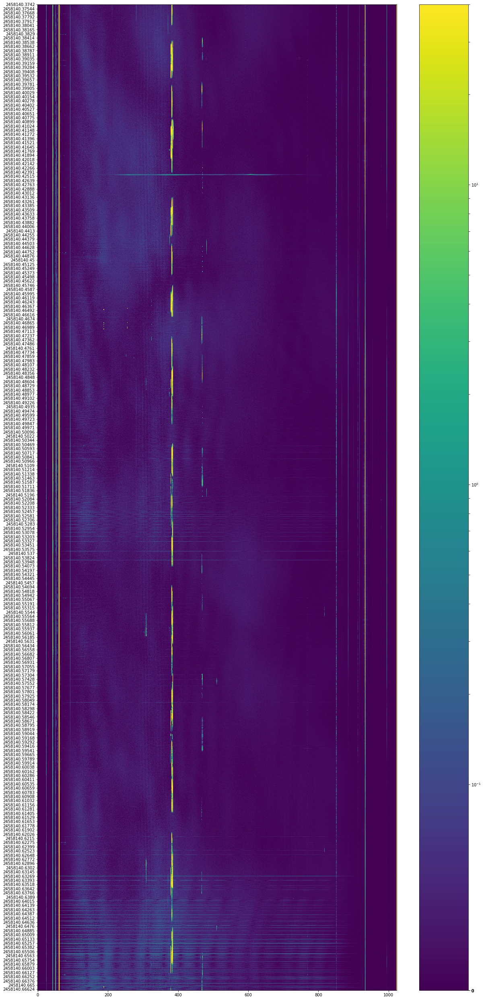

In [23]:
plt.figure(figsize=(20,45))
plt.imshow(np.abs(full_array3[2000:][:]),aspect='auto', norm=SymLogNorm(vmin=0,vmax=40,linthresh=.1))
plt.yticks(np.arange(0,2353,10),timearr3[2000::10])
plt.colorbar()
plt.show()


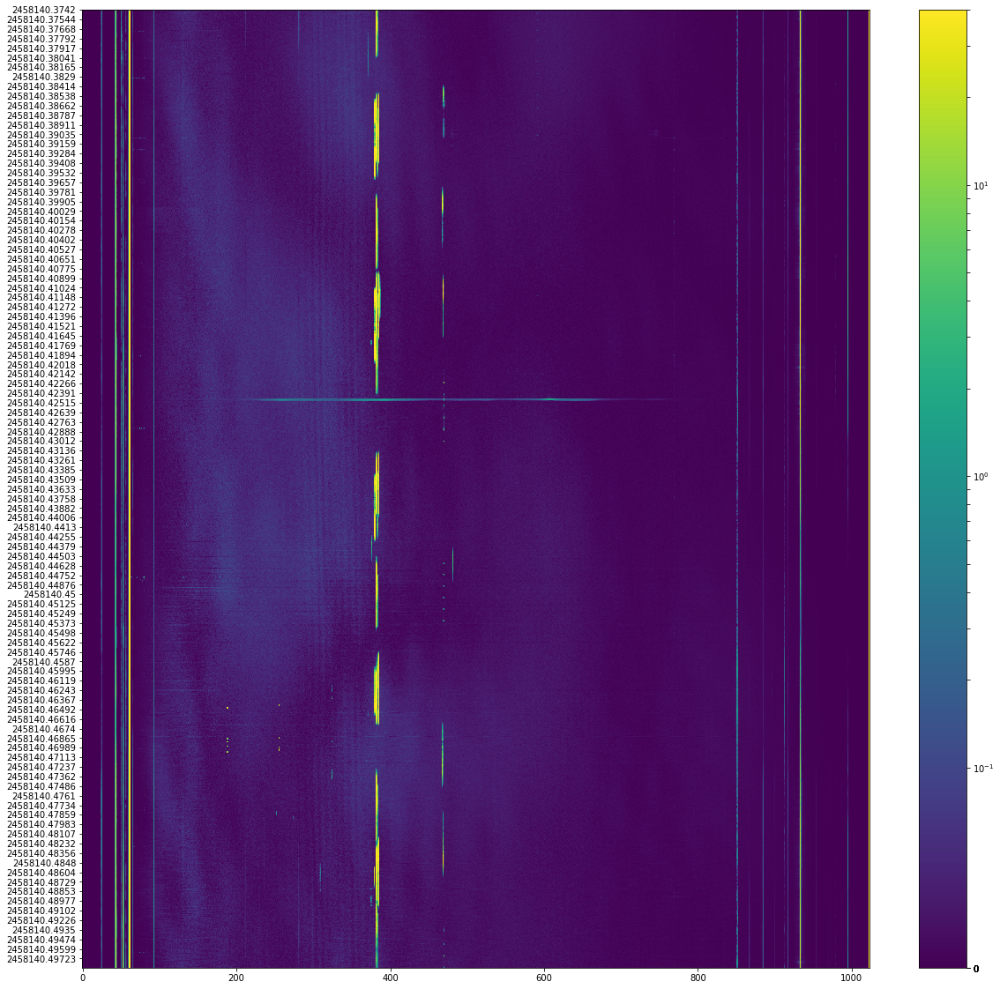

In [9]:
plt.figure(figsize=(20,20))
plt.imshow(np.abs(full_array3[2000:3000][:]),aspect='auto', norm=SymLogNorm(vmin=0,vmax=40,linthresh=.1))
plt.yticks(np.arange(0,1000,10),timearr3[2000:3000:10])
plt.colorbar()
plt.show()


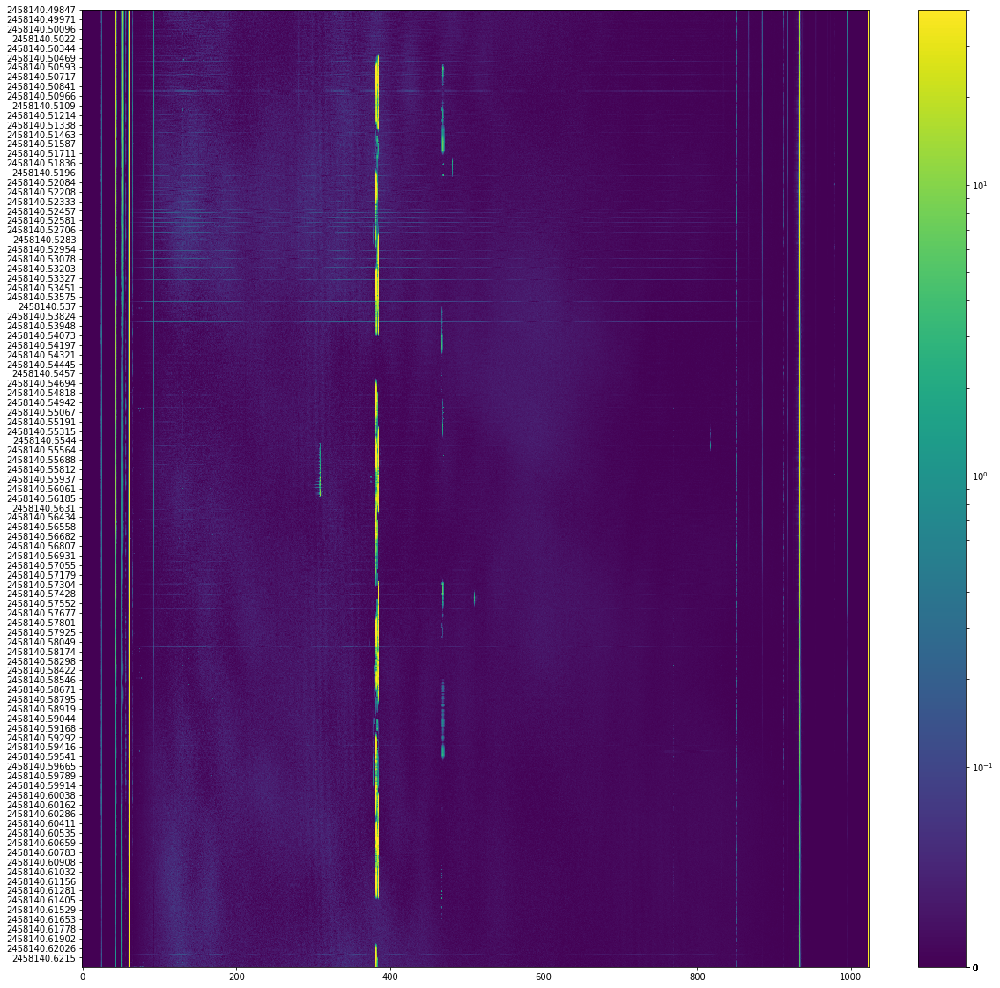

In [10]:
plt.figure(figsize=(20,20))
plt.imshow(np.abs(full_array3[3000:4000][:]),aspect='auto', norm=SymLogNorm(vmin=0,vmax=40,linthresh=.1))
plt.yticks(np.arange(0,1000,10),timearr3[3000:4000:10])
plt.colorbar()
plt.show()


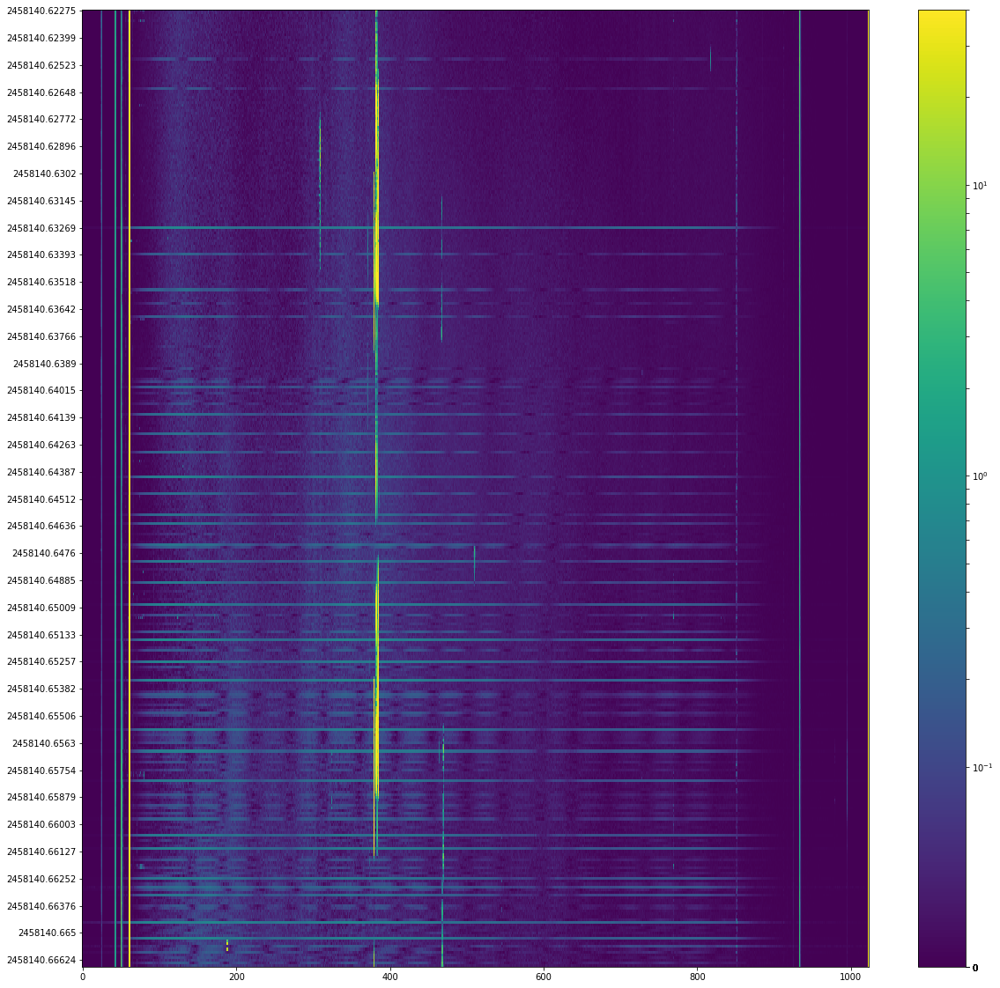

In [11]:
plt.figure(figsize=(20,20))
plt.imshow(np.abs(full_array3[4000:][:]),aspect='auto', norm=SymLogNorm(vmin=0,vmax=40,linthresh=.1))
plt.yticks(np.arange(0,353,10),timearr3[4000::10])
plt.colorbar()
plt.show()


We can also view this as the phasing:

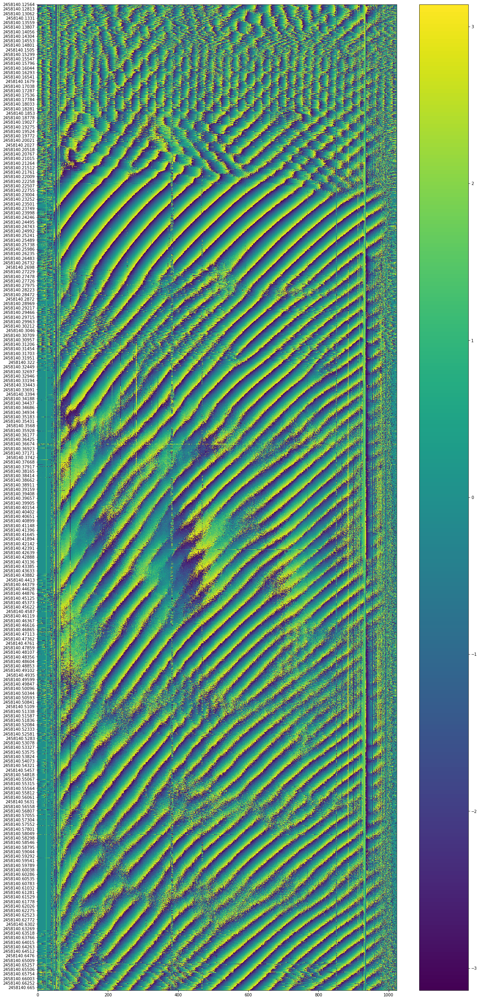

In [36]:
plt.figure(figsize=(20,45))
plt.imshow(np.angle(full_array3[:][:]),aspect='auto')
plt.yticks(np.arange(0,4353,20),timearr3[::20])
plt.colorbar()
plt.show()

In [27]:
'''
plt.figure(figsize=(20,45))
plt.imshow(np.angle(full_array3[2000:][:]),aspect='auto')
plt.yticks(np.arange(0,2353,10),timearr3[2000::10])
plt.colorbar()
plt.show()
'''

"\nplt.figure(figsize=(20,45))\nplt.imshow(np.angle(full_array3[2000:][:]),aspect='auto')\nplt.yticks(np.arange(0,2353,10),timearr3[2000::10])\nplt.colorbar()\nplt.show()\n"

The uvOR files have flag data associated with them. It would be good to take these flags and apply them to the data above, and see how much of the artifacting remains.

In [13]:
folders4=glob.glob('/data6/HERA/data/2458140/*.uvOR')
folders4.sort()

first=True
flag_array=[]
timearr4=[]
#check the list
print(folders4)
print(len(folders4))

for folder in folders4:
    UV.read_miriad(folder, ant_pairs_nums=[(ant1,ant2)])
    print('Accessing ' + folder)
    temp_array4=np.abs(UV.get_flags((ant1,ant2,UV.polarization_array[0])))
    times=UV.get_times(ant1,ant2)
    UV.set_lsts_from_time_array()
    ind=UV.antpair2ind(ant1,ant2)
    temptime4=UV.lst_array[ind]
    if first==True:
        print('Settings flags for first time')
        flag_array=temp_array4
        timearr4=times
        first=False
    else:
        print('vstacking...')
        flag_array=np.vstack((flag_array, temp_array4))
        timearr4=np.hstack((timearr4, times))
    print(first)
    print('temp shape:')
    print(temp_array4.shape)
    print('Current shape:')
    print(flag_array.shape)
    print('Current time shape')
    print(timearr4.shape)

['/../../data6/HERA/data/2458140/zen.2458140.12564.xx.HH.uvOR', '/../../data6/HERA/data/2458140/zen.2458140.13310.xx.HH.uvOR', '/../../data6/HERA/data/2458140/zen.2458140.14056.xx.HH.uvOR', '/../../data6/HERA/data/2458140/zen.2458140.14801.xx.HH.uvOR', '/../../data6/HERA/data/2458140/zen.2458140.15547.xx.HH.uvOR', '/../../data6/HERA/data/2458140/zen.2458140.16293.xx.HH.uvOR', '/../../data6/HERA/data/2458140/zen.2458140.17038.xx.HH.uvOR', '/../../data6/HERA/data/2458140/zen.2458140.17784.xx.HH.uvOR', '/../../data6/HERA/data/2458140/zen.2458140.18530.xx.HH.uvOR', '/../../data6/HERA/data/2458140/zen.2458140.19275.xx.HH.uvOR', '/../../data6/HERA/data/2458140/zen.2458140.20021.xx.HH.uvOR', '/../../data6/HERA/data/2458140/zen.2458140.20767.xx.HH.uvOR', '/../../data6/HERA/data/2458140/zen.2458140.21512.xx.HH.uvOR', '/../../data6/HERA/data/2458140/zen.2458140.22258.xx.HH.uvOR', '/../../data6/HERA/data/2458140/zen.2458140.23004.xx.HH.uvOR', '/../../data6/HERA/data/2458140/zen.2458140.23749.xx.H

In [14]:
print timearr4

[ 2458140.12564476  2458140.12576904  2458140.12589331 ...,
  2458140.66624394  2458140.66636822  2458140.66649249]


In [ ]:
#get the times from a portion of above, convert to LST so we can check it against a good time
times=UV.get_times(ant1,ant2)
#print(times)
UV.set_lsts_from_time_array()
ind=UV.antpair2ind(ant1,ant2)
lst_times=UV.lst_array[ind]

In [ ]:
print(flag_array) #sanity check

In [21]:
#mask the full array with the flags.
fullmask_array=ma.masked_array(full_array3,flag_array)

In [22]:
print(fullmask_array) #sanity check

[[-- -- -- ..., -- -- --]
 [-- -- -- ..., -- -- --]
 [-- -- -- ..., -- -- --]
 ..., 
 [-- -- -- ..., -- -- --]
 [-- -- -- ..., -- -- --]
 [-- -- -- ..., -- -- --]]


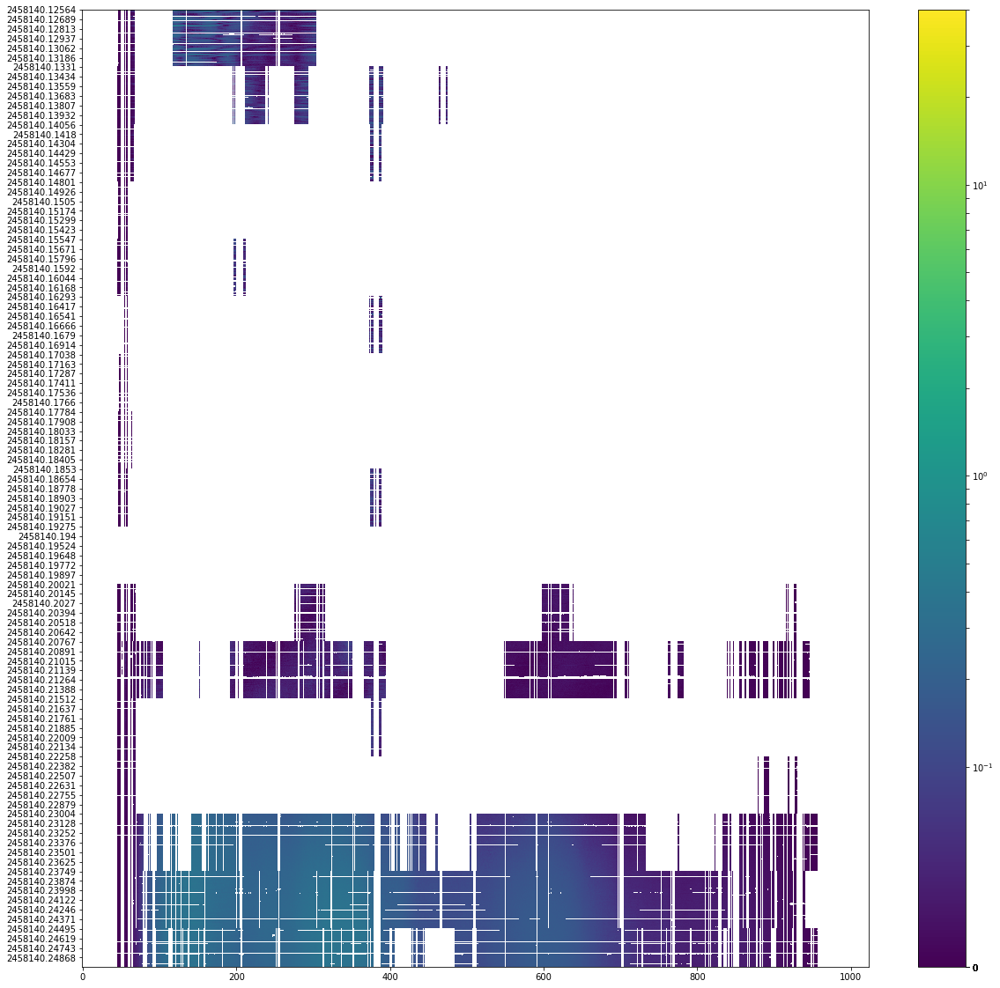

In [24]:
#this plot masks the flagged visibilities and displays what remains.
#plot the array
plt.figure(figsize=(20,20))
plt.imshow(fullmask_array[0:1000][:],aspect='auto', norm=SymLogNorm(vmin=0,vmax=40,linthresh=.1))
plt.yticks(np.arange(0,1000,10),timearr4[0:1000:10])
plt.colorbar()
plt.show()

In [ ]:
plt.figure(figsize=(20,20))
plt.imshow(fullmask_array[1000:2000][:],aspect='auto', norm=SymLogNorm(vmin=0,vmax=40,linthresh=.1))
plt.colorbar()
plt.show()

In [ ]:
plt.figure(figsize=(20,20))
plt.imshow(fullmask_array[2000:3000][:],aspect='auto', norm=SymLogNorm(vmin=0,vmax=40,linthresh=.1))
plt.colorbar()
plt.show()

In [ ]:
plt.figure(figsize=(20,20))
plt.imshow(fullmask_array[3000:4000][:],aspect='auto', norm=SymLogNorm(vmin=0,vmax=40,linthresh=.1))
plt.colorbar()
plt.show()

In [ ]:
plt.figure(figsize=(20,20))
plt.imshow(fullmask_array[4000:][:],aspect='auto', norm=SymLogNorm(vmin=0,vmax=40,linthresh=.1))
plt.colorbar()
plt.show()

That sure is a lot of flags. We should check these flags across the entire observation period for all baselines. That process can be found in the AverageFLags python notebook, where this investigation continues.